<a href="https://colab.research.google.com/github/tanmayi-sharma/Parking-Citations-Analysis/blob/main/Notebooks/More_Slicings.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TIMESERIES COMPARISON OF TOP 5 VIOLATIONS IN PARKING DATA WITH MOBILITY DATASETS

* In this notebook, we see the timeseries comparisons of the top 5


>1. Libraries and Data Import
2. Data preprocessing and manipulation
3. Time-series visualization of each of the top 5 parking violation occurances. (Blue)
4. Time-series visualization of the three mobility datasets and parking data. (Google - Violet, Apple - Orange, Meta - Red)
4. Google Mobility Vs Top 5 Parking violations (Violet)
5. Apple Mobility Vs Top 5 Parking Violations (Orange)
7. Meta Mobility Vs Top 5 Parking Violations (Red)

##1. Libraries and Data Import

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import folium
import matplotlib
import math
import matplotlib.pyplot as plt
from sklearn import preprocessing
from matplotlib.pyplot import figure
%matplotlib inline

In [ ]:
df = pd.read_csv('/content/drive/My Drive/Parking citations/parking_citations_covid_2020_2022.csv')

<ipython-input-3-5f9000c1f725>:1: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/drive/My Drive/Parking citations/parking_citations_covid_2020_2022.csv')


In [ ]:
df['Fine amount'].describe()

count    5.701294e+06
mean     7.333449e+01
std      4.594399e+01
min      0.000000e+00
25%      6.300000e+01
50%      6.800000e+01
75%      7.300000e+01
max      1.100000e+03
Name: Fine amount, dtype: float64

In [ ]:
len(df[df['Fine amount']>100])/len(df)

0.02775695851975857

In [ ]:
df_google = pd.read_csv('/content/drive/My Drive/Parking citations/google_mobility_concat.csv')

In [ ]:
df_apple = pd.read_csv('/content/drive/My Drive/Parking citations/apple_mobility_modified.csv')

In [ ]:
df_meta = pd.read_csv('/content/drive/My Drive/Parking citations/meta_mobility_concat.csv')

<ipython-input-3-eed66181ba1c>:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df_meta = pd.read_csv('/content/drive/My Drive/Parking citations/meta_mobility_concat.csv')


In [ ]:
df['Issue Date'] = pd.to_datetime(df['Issue Date'])

In [ ]:
df_google['date'] = pd.to_datetime(df_google['date'])

In [ ]:
df_apple['Date'] = pd.to_datetime(df_apple['Date'])

In [ ]:
df_meta['ds'] = pd.to_datetime(df_meta['ds'])

##2. Data preprocessing and manipulation

Extracting the top 5 Violations in the parking data

In [ ]:
group_top_vd = df.groupby('Violation code')['Ticket number'].count().reset_index(name='Total Tickets')
top_5_vd = group_top_vd.nlargest(5, 'Total Tickets')

In [ ]:
top_5_vd = top_5_vd.sort_values(by = 'Total Tickets', ascending = False)

In [ ]:
top_5_vd['Rank'] = range(1,len(top_5_vd)+1)

In [ ]:
top_5_data_vd = df[df['Violation code'].isin(top_5_vd['Violation code'])]

In [ ]:
top_5_data = pd.merge(top_5_data_vd[['Ticket number','Violation code','Violation Description','Issue Date','Fine amount']], top_5_vd[['Violation code','Rank']], left_on='Violation code', right_on = 'Violation code', how = 'inner')

In [ ]:
top_5_data['Issue Date'] = pd.to_datetime(top_5_data['Issue Date'])

In [ ]:
top_5_data

,Ticket number,Violation code,Violation Description,Issue Date,Fine amount,Rank
0,4517995344,80.56E4+,RED ZONE,2020-10-13,93.0,3
1,4517995333,80.56E4+,RED ZONE,2020-10-13,93.0,3
2,4519016725,80.56E4+,RED ZONE,2020-10-13,93.0,3
3,4518474564,80.56E4+,RED ZONE,2020-10-13,93.0,3
4,4518902242,80.56E4+,RED ZONE,2020-10-13,93.0,3
...,...,...,...,...,...,...
3083586,4549935821,5204A-,DISPLAY OF TABS,2022-05-29,25.0,5
3083587,4549578025,5204A-,DISPLAY OF TABS,2022-05-29,25.0,5
3083588,4549578003,5204A-,DISPLAY OF TABS,2022-05-29,25.0,5
3083589,4549903724,5204A-,DISPLAY OF TABS,2022-05-29,25.0,5


These are the top 5 violations

In [ ]:
top_5_data.groupby('Rank')['Violation Description'].unique().reset_index()

,Rank,Violation Description
0,1,[NO PARK/STREET CLEAN]
1,2,"[METER EXP., DISPLAY OF PLATES]"
2,3,[RED ZONE]
3,4,[PREFERENTIAL PARKING]
4,5,[DISPLAY OF TABS]


##3. Time-series visualization of each of the top 5 parking violation occurances

In [ ]:
top_5_data['Issue Date'] = pd.to_datetime(top_5_data['Issue Date'])
grouped = top_5_data.groupby(['Violation Description', top_5_data['Issue Date'].dt.date])['Ticket number'].count().unstack(0)

In [ ]:
grouped = grouped.drop(columns = 'DISPLAY OF PLATES')

In [ ]:
grouped['pct_change_DOT'] = ((grouped['DISPLAY OF TABS'] - grouped['DISPLAY OF TABS'].mean()) / grouped['DISPLAY OF TABS'].mean())*100
grouped['pct_change_ME'] = ((grouped['METER EXP.'] - grouped['METER EXP.'].mean()) / grouped['METER EXP.'].mean())*100
grouped['pct_change_NP'] = ((grouped['NO PARK/STREET CLEAN'] - grouped['NO PARK/STREET CLEAN'].mean()) / grouped['NO PARK/STREET CLEAN'].mean())*100
grouped['pct_change_PP'] = ((grouped['PREFERENTIAL PARKING'] - grouped['PREFERENTIAL PARKING'].mean()) / grouped['PREFERENTIAL PARKING'].mean())*100
grouped['pct_change_RZ'] = ((grouped['RED ZONE'] - grouped['RED ZONE'].mean()) / grouped['RED ZONE'].mean())*100

In [ ]:
grouped.sum()

Violation Description
DISPLAY OF TABS         2.654160e+05
METER EXP.              7.855210e+05
NO PARK/STREET CLEAN    1.178851e+06
PREFERENTIAL PARKING    3.417470e+05
RED ZONE                5.120550e+05
pct_change_DOT          9.094947e-12
pct_change_ME          -1.364242e-12
pct_change_NP           0.000000e+00
pct_change_PP          -7.275958e-12
pct_change_RZ           0.000000e+00
dtype: float64

In [ ]:
grouped.index = pd.to_datetime(grouped.index)

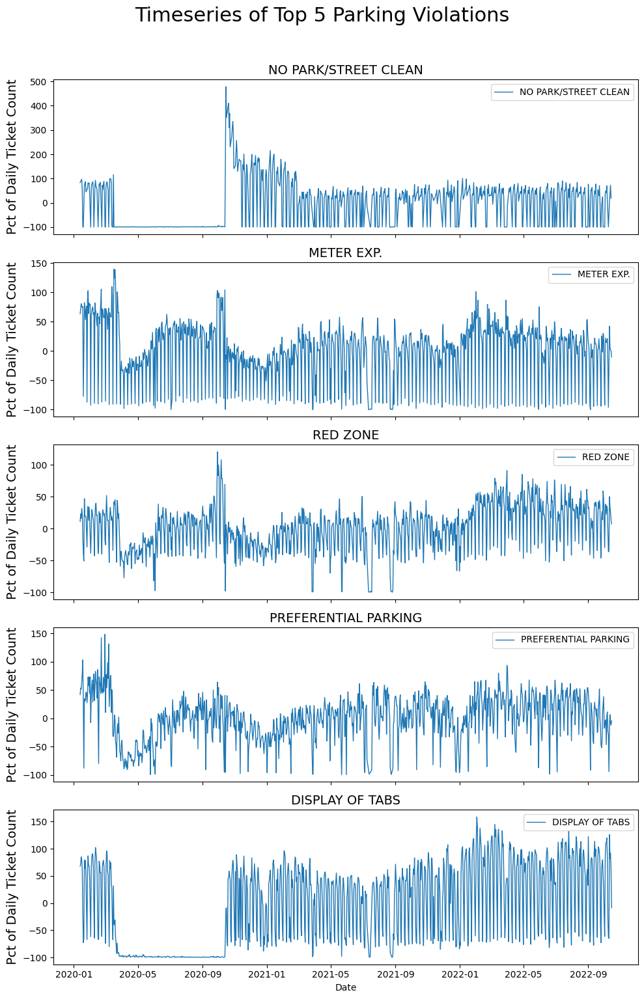

In [ ]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(10, 15), sharex=True)
violation_title = ['NO PARK/STREET CLEAN', 'METER EXP.', 'RED ZONE', 'PREFERENTIAL PARKING',
       'DISPLAY OF TABS']
violation_pct = ['pct_change_NP','pct_change_ME','pct_change_RZ','pct_change_PP','pct_change_DOT']
for i, (violation_description,t) in enumerate(zip(violation_pct,violation_title)):
    sns.lineplot(x=grouped.index, y=grouped[violation_description], ax=axes[i], label=t, linewidth = 1)
    axes[i].set_ylabel('Pct of Daily Ticket Count', fontsize = 14)
    axes[i].set_title(t, fontsize = 14)
    axes[i].legend()
axes[-1].set_xlabel('Date')
plt.suptitle("Timeseries of Top 5 Parking Violations", y=1.02, fontsize = 22)
plt.tight_layout()
plt.show()

##4. Time-series visualization of the three mobility datasets and parking data. (Google - Violet, Apple - Orange, Meta - Red)

Google mobility timeseries

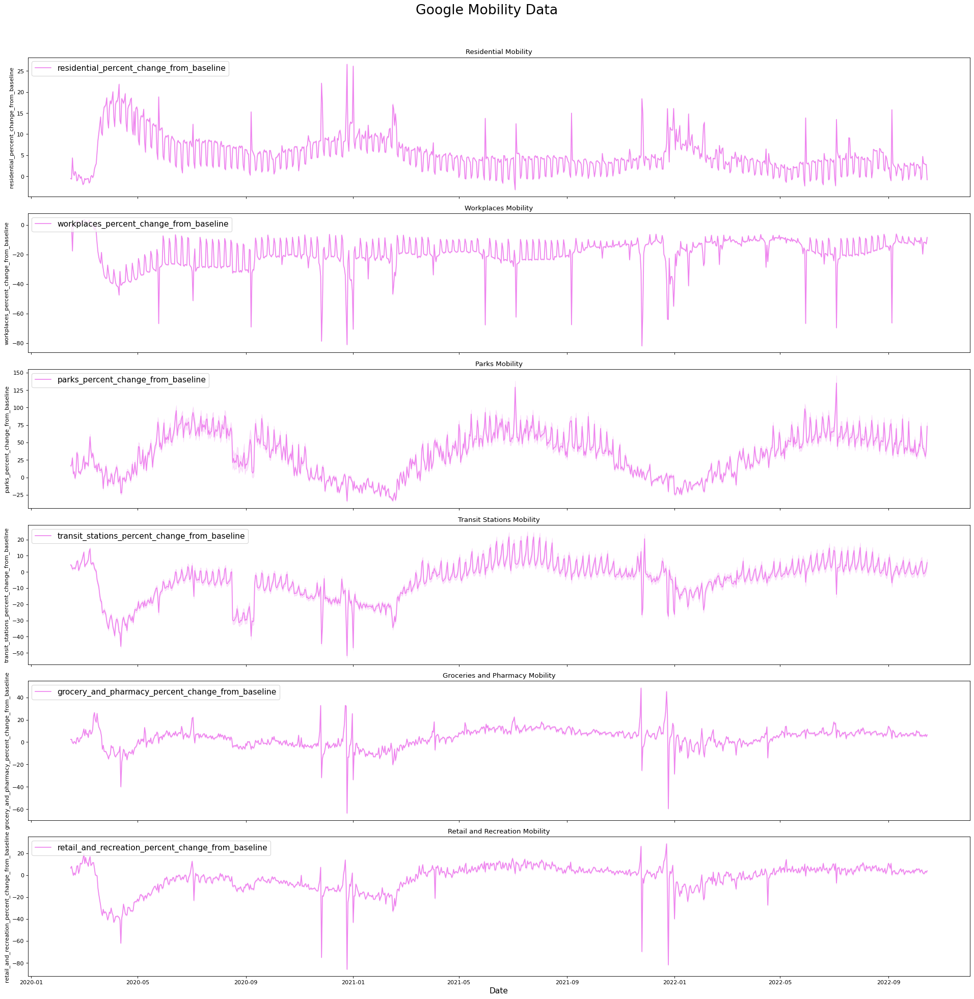

In [ ]:
fig, axes = plt.subplots(6, 1, figsize=(24, 24), dpi=80, sharex=True)
columns_to_compare = [
    "residential_percent_change_from_baseline",
    "workplaces_percent_change_from_baseline",
    "parks_percent_change_from_baseline",
    "transit_stations_percent_change_from_baseline",
    "grocery_and_pharmacy_percent_change_from_baseline",
    "retail_and_recreation_percent_change_from_baseline"
]
subplot_titles = [
    "Residential Mobility",
    "Workplaces Mobility",
    "Parks Mobility",
    "Transit Stations Mobility",
    "Groceries and Pharmacy Mobility",
    "Retail and Recreation Mobility"
]
for i, (column,title) in enumerate(zip(columns_to_compare,subplot_titles)):
    sns.lineplot(data=df_google, x="date", y=column, label=column, ax=axes[i], color = 'Violet')
    #sns.lineplot(x=x_parking, y=y_parking, label='Parking Data', ax=axes[i])
    axes[i].set_ylabel(column)
    axes[i].set_xlabel('Date', fontsize=14)
    axes[i].set_title(title)
    axes[i].legend(loc = "upper left",fontsize = 14)
plt.suptitle('Google Mobility Data', fontsize=24, y=1.02)
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.4)
axes[-1].set_xlabel('Date', fontsize=14)
plt.tight_layout()
plt.show()

Apple mobility timeseries

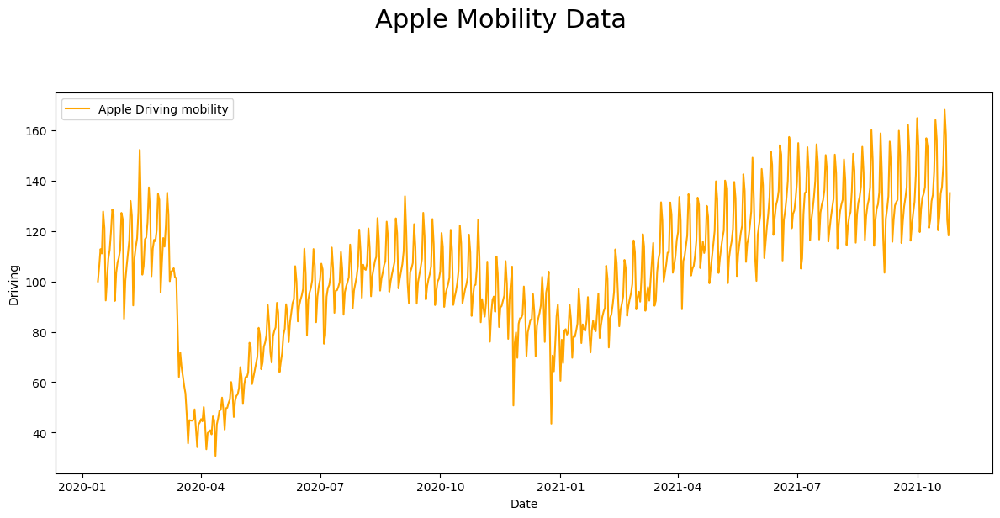

In [ ]:
fig, axes = plt.subplots(figsize=(12,6))
sns.lineplot(data=df_apple, x = 'Date', y='Driving',ax=axes, label = 'Apple Driving mobility', color = 'Orange')
#xticks = range(0, len(df_apple), 100)
#xticklabels = df_apple['Date'][::100]
#axes.set_xticks(xticks)
axes.legend(loc='upper left')
#axes.set_xticklabels(xticklabels)
plt.suptitle('Apple Mobility Data', fontsize=22, y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Meta mobility timeseries

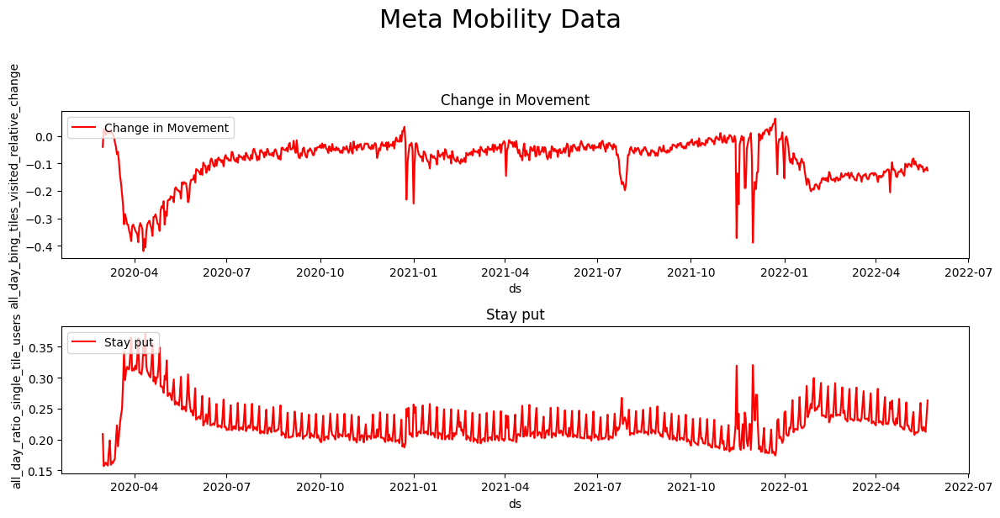

In [ ]:
fig, axes = plt.subplots(2,1,figsize=(12,6))
sns.lineplot(data=df_meta, x = 'ds', y='all_day_bing_tiles_visited_relative_change',ax=axes[0], label = 'Change in Movement', color = 'Red')
axes[0].legend(loc='upper left')
axes[0].set_title('Change in Movement')

sns.lineplot(data=df_meta, x = 'ds', y='all_day_ratio_single_tile_users',ax=axes[1], label = 'Stay put', color = 'Red')
axes[1].legend(loc='upper left')
axes[1].set_title('Stay put')
plt.suptitle('Meta Mobility Data', fontsize=22, y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

##5. Google Mobility Vs. Top 5 Parking violations


####Performing Median Normalization on Parking Data


In [ ]:
top_5_data_vd_google = top_5_data[(top_5_data['Issue Date'] >= '02-15-2020') & (top_5_data['Issue Date'] <= '10-15-2022' ) ]

In [ ]:
daily_ticket_count = top_5_data_vd_google.groupby('Issue Date')['Ticket number'].count()

In [ ]:
top_5_data_vd_google = top_5_data_vd_google.sort_values(by='Issue Date')
df_google = df_google.sort_values(by='date')

In [ ]:
top_5_data_vd_google['day'] = top_5_data_vd_google['Issue Date'].dt.day_name()

Extracting data for Median normalization calculation

In [ ]:
filtered_df_google= top_5_data_vd_google[(top_5_data_vd_google['Issue Date'] >= '2020-01-01') & (top_5_data_vd_google['Issue Date'] <= '2020-02-29')]

Computing median of number of tickets for each weekday

In [ ]:
med_list= []
weekdays = ['Monday','Tuesday','Wednesday', 'Thursday','Friday','Saturday', 'Sunday']
for i in range(len(weekdays)):
    m = filtered_df_google[filtered_df_google['day'] == weekdays[i]]
    c = m.groupby('Issue Date')['Ticket number'].count()
    a = c.median()
    med_list.append(a)

In [ ]:
median_weekdays = pd.DataFrame({'Weekday' : weekdays, 'Median_baseline_count' : med_list})


In [ ]:
ex = pd.merge(top_5_data_vd_google, median_weekdays, left_on = 'day',right_on = 'Weekday', how = 'inner')


In [ ]:
ex

,Ticket number,Violation code,Violation Description,Issue Date,Fine amount,Rank,day,Weekday,Median_baseline_count
0,4511397144,80.56E4+,RED ZONE,2020-02-15,93.0,3,Saturday,Saturday,2875.0
1,4511311276,88.13B+,METER EXP.,2020-02-15,63.0,2,Saturday,Saturday,2875.0
2,4511657054,80.58L,PREFERENTIAL PARKING,2020-02-15,68.0,4,Saturday,Saturday,2875.0
3,4510812725,88.13B+,METER EXP.,2020-02-15,63.0,2,Saturday,Saturday,2875.0
4,4511476535,88.13B+,METER EXP.,2020-02-15,63.0,2,Saturday,Saturday,2875.0
...,...,...,...,...,...,...,...,...,...
2935251,4557243482,80.69BS,NO PARK/STREET CLEAN,2022-10-14,73.0,1,Friday,Friday,4965.0
2935252,4555425291,80.69BS,NO PARK/STREET CLEAN,2022-10-14,73.0,1,Friday,Friday,4965.0
2935253,4556772743,80.69BS,NO PARK/STREET CLEAN,2022-10-14,73.0,1,Friday,Friday,4965.0
2935254,4556731524,80.69BS,NO PARK/STREET CLEAN,2022-10-14,73.0,1,Friday,Friday,4965.0


In [ ]:
per_day_count = ex.groupby(ex['Issue Date']).size()
per_day_count= per_day_count.to_frame().reset_index()
per_day_count.columns = ['Issue Date', 'Counts']
#per_day_count['day'] = per_day_count['Issue Date'].dt.day_name()
per_day_count = pd.merge(top_5_data_vd_google, per_day_count, left_on = 'Issue Date', right_on = 'Issue Date')

In [ ]:
per_day_count

,Ticket number,Violation code,Violation Description,Issue Date,Fine amount,Rank,day,Counts
0,4511397144,80.56E4+,RED ZONE,2020-02-15,93.0,3,Saturday,2682
1,4511311276,88.13B+,METER EXP.,2020-02-15,63.0,2,Saturday,2682
2,4511657054,80.58L,PREFERENTIAL PARKING,2020-02-15,68.0,4,Saturday,2682
3,4510812725,88.13B+,METER EXP.,2020-02-15,63.0,2,Saturday,2682
4,4511476535,88.13B+,METER EXP.,2020-02-15,63.0,2,Saturday,2682
...,...,...,...,...,...,...,...,...
2935251,4557007851,80.58L,PREFERENTIAL PARKING,2022-10-15,68.0,4,Saturday,1855
2935252,4556436102,80.58L,PREFERENTIAL PARKING,2022-10-15,68.0,4,Saturday,1855
2935253,4556436146,80.58L,PREFERENTIAL PARKING,2022-10-15,68.0,4,Saturday,1855
2935254,4556950156,88.13B+,METER EXP.,2022-10-15,63.0,2,Saturday,1855


In [ ]:
req_df = pd.merge(per_day_count, median_weekdays, left_on = 'day', right_on = 'Weekday')


Calculating percentage change for ticket counts based on median on parking data

In [ ]:
req_df['pct_change'] = ((req_df['Counts'] - req_df['Median_baseline_count'])*100)/req_df['Median_baseline_count']


In [ ]:
req_df = req_df.drop(columns = 'day')

In [ ]:
req_df_noparking = req_df[req_df['Violation Description'] == 'NO PARK/STREET CLEAN']

In [ ]:
req_df_meterexp = req_df[req_df['Violation Description'] == 'METER EXP.']

In [ ]:
req_df_redzone = req_df[req_df['Violation Description'] == 'RED ZONE']

In [ ]:
req_df_prefpark = req_df[req_df['Violation Description'] == 'PREFERENTIAL PARKING']

In [ ]:
req_df_dispoftabs= req_df[req_df['Violation Description'] == 'DISPLAY OF TABS']

####i. No Parking/ Street Cleaning Violation Data Vs Google Mobility

In [ ]:
grouped_g = grouped[grouped.index >= df_google['date'].min()]

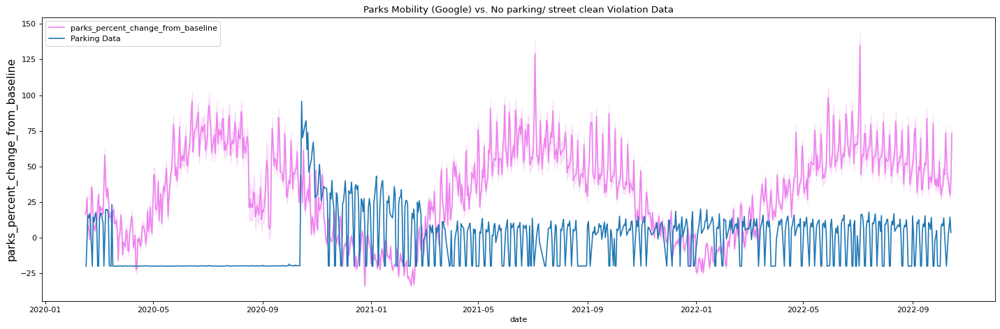

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(18,6), dpi=80, sharex=True)
sns.lineplot(data=df_google, x="date", y= "parks_percent_change_from_baseline", label="parks_percent_change_from_baseline", color='Violet', ax=axes)
sns.lineplot(x=grouped_g.index, y=grouped_g['pct_change_NP']/5, label='Parking Data', ax=axes)
axes.set_ylabel("parks_percent_change_from_baseline", fontsize = 14)
axes.set_title("Parks Mobility (Google) vs. No parking/ street clean Violation Data")
axes.legend()
plt.tight_layout()
plt.show()


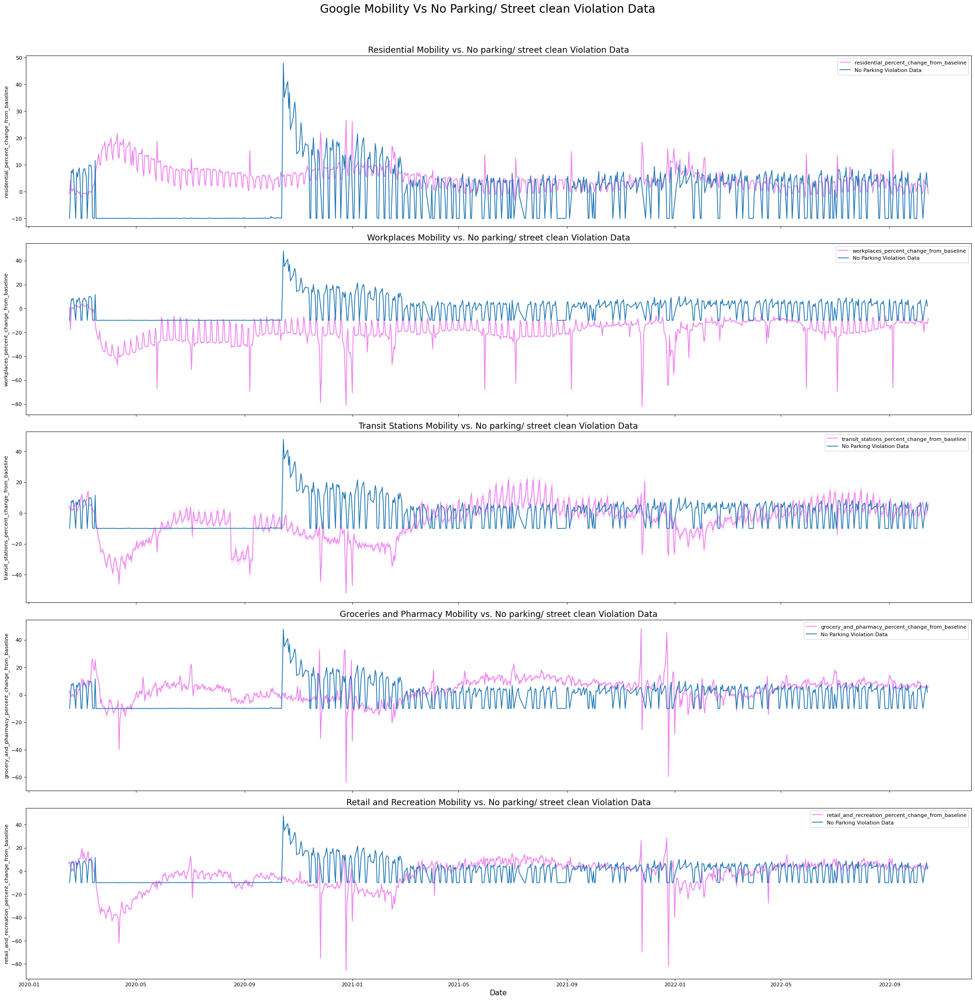

In [ ]:

fig, axes = plt.subplots(5, 1, figsize=(26, 26), dpi=80, sharex=True)
columns_to_compare = [
    "residential_percent_change_from_baseline",
    "workplaces_percent_change_from_baseline",
    "transit_stations_percent_change_from_baseline",
    "grocery_and_pharmacy_percent_change_from_baseline",
    "retail_and_recreation_percent_change_from_baseline"
]
subplot_titles = [
    "Residential Mobility vs. No parking/ street clean Violation Data",
    "Workplaces Mobility vs. No parking/ street clean Violation Data",
    "Transit Stations Mobility vs. No parking/ street clean Violation Data",
    "Groceries and Pharmacy Mobility vs. No parking/ street clean Violation Data",
    "Retail and Recreation Mobility vs. No parking/ street clean Violation Data"
]
for i, (column, title) in enumerate(zip(columns_to_compare, subplot_titles)):
    sns.lineplot(data=df_google, x="date", y=df_google[column], label=column, color='Violet', ax=axes[i])
    sns.lineplot(x=grouped_g.index, y=grouped_g['pct_change_NP']/10, label='No Parking Violation Data', ax=axes[i])
    axes[i].set_ylabel(column)
    axes[i].set_title(title, fontsize = 16)
    axes[i].legend()
axes[-1].set_xlabel('Date',fontsize = 14)
plt.suptitle("Google Mobility Vs No Parking/ Street clean Violation Data", fontsize = 22, y = 1.02)
plt.tight_layout()
plt.show()


####ii. Meter Expired Violation Data Vs Google Mobility

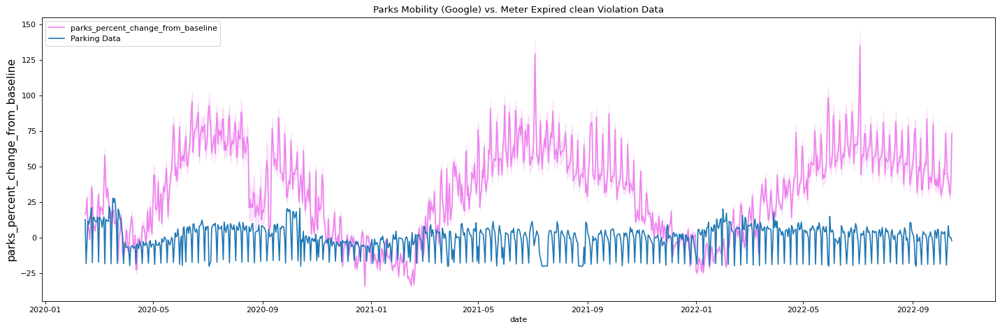

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(18,6), dpi=80, sharex=True)
sns.lineplot(data=df_google, x="date", y= "parks_percent_change_from_baseline", label="parks_percent_change_from_baseline", color='Violet', ax=axes)
sns.lineplot(x=grouped_g.index, y=grouped_g['pct_change_ME']/5, label='Parking Data', ax=axes)
axes.set_ylabel("parks_percent_change_from_baseline", fontsize = 14)
axes.set_title("Parks Mobility (Google) vs. Meter Expired clean Violation Data")
axes.legend()
plt.tight_layout()
plt.show()


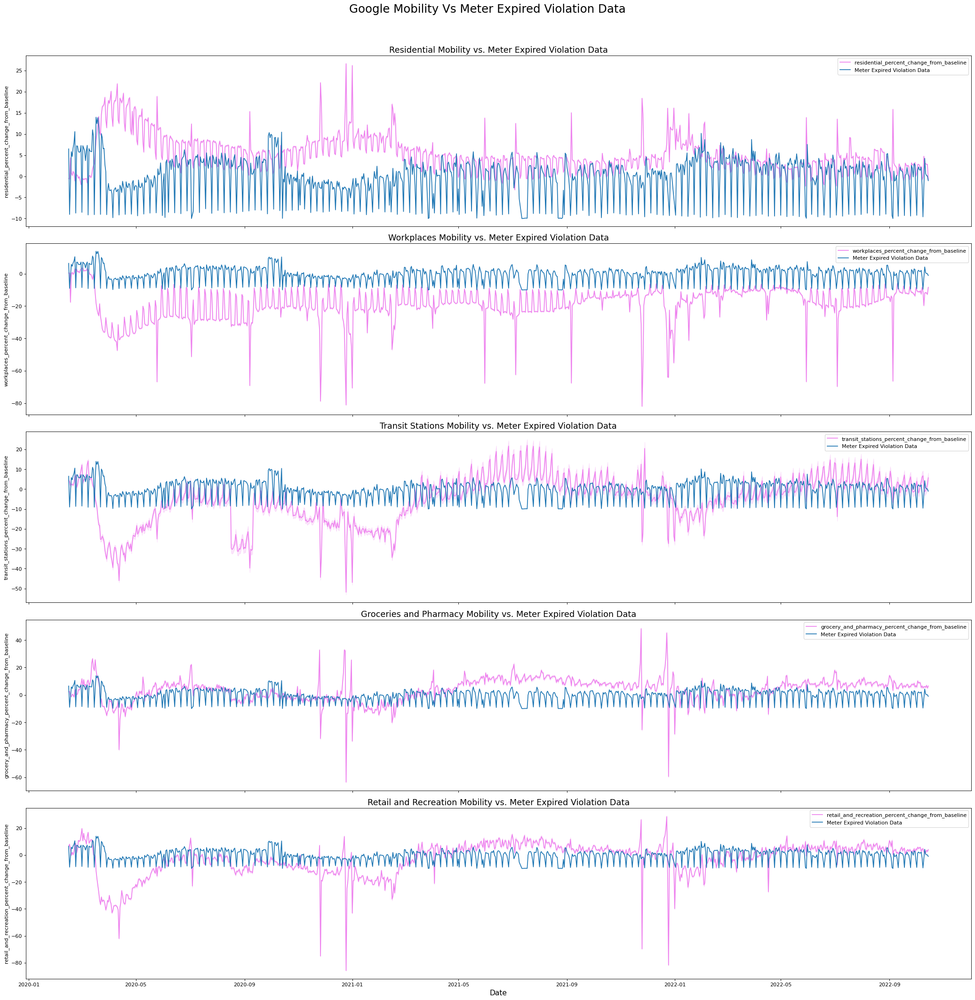

In [ ]:

fig, axes = plt.subplots(5, 1, figsize=(26, 26), dpi=80, sharex=True)
columns_to_compare = [
    "residential_percent_change_from_baseline",
    "workplaces_percent_change_from_baseline",
    "transit_stations_percent_change_from_baseline",
    "grocery_and_pharmacy_percent_change_from_baseline",
    "retail_and_recreation_percent_change_from_baseline"
]
subplot_titles = [
    "Residential Mobility vs. Meter Expired Violation Data",
    "Workplaces Mobility vs. Meter Expired Violation Data",
    "Transit Stations Mobility vs. Meter Expired Violation Data",
    "Groceries and Pharmacy Mobility vs. Meter Expired Violation Data",
    "Retail and Recreation Mobility vs. Meter Expired Violation Data"
]
for i, (column, title) in enumerate(zip(columns_to_compare, subplot_titles)):
    sns.lineplot(data=df_google, x="date", y=df_google[column], label=column, color='Violet', ax=axes[i])
    sns.lineplot(x=grouped_g.index, y=grouped_g['pct_change_ME']/10, label='Meter Expired Violation Data', ax=axes[i])
    axes[i].set_ylabel(column)
    axes[i].set_title(title, fontsize = 16)
    axes[i].legend()
axes[-1].set_xlabel('Date',fontsize = 14)
plt.suptitle("Google Mobility Vs Meter Expired Violation Data", fontsize = 22, y = 1.02)
plt.tight_layout()
plt.show()


####iii. Red Zone Violation Data Vs Google Mobility

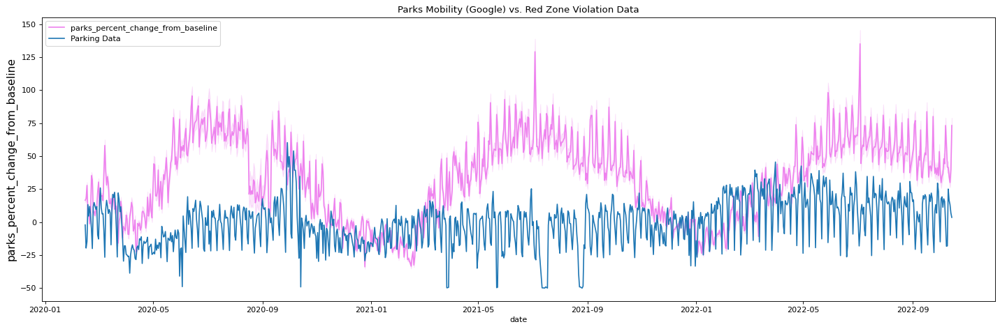

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(18,6), dpi=80, sharex=True)
sns.lineplot(data=df_google, x="date", y= "parks_percent_change_from_baseline", label="parks_percent_change_from_baseline", color='Violet', ax=axes)
sns.lineplot(x=grouped_g.index, y=grouped_g['pct_change_RZ']/2, label='Parking Data', ax=axes)
axes.set_ylabel("parks_percent_change_from_baseline", fontsize = 14)
axes.set_title("Parks Mobility (Google) vs. Red Zone Violation Data")
axes.legend()
plt.tight_layout()
plt.show()


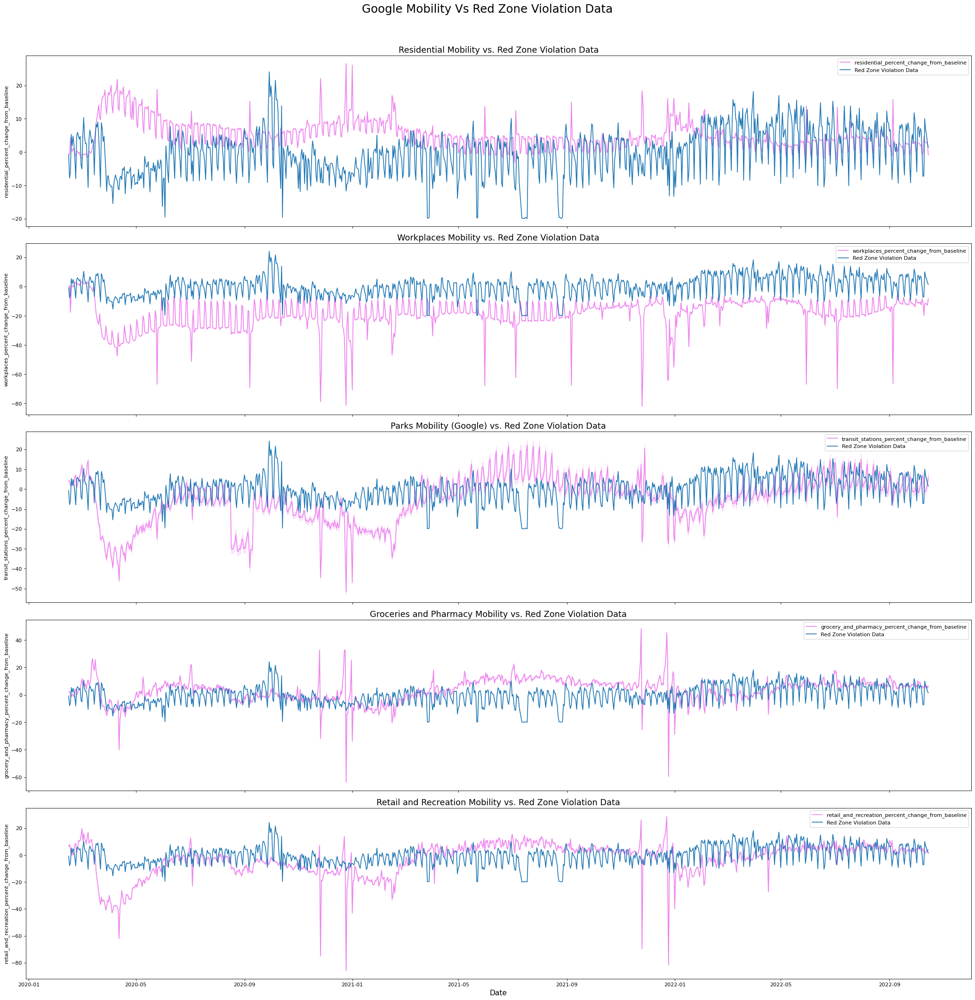

In [ ]:

fig, axes = plt.subplots(5, 1, figsize=(26, 26), dpi=80, sharex=True)
columns_to_compare = [
    "residential_percent_change_from_baseline",
    "workplaces_percent_change_from_baseline",
    "transit_stations_percent_change_from_baseline",
    "grocery_and_pharmacy_percent_change_from_baseline",
    "retail_and_recreation_percent_change_from_baseline"
]
subplot_titles = [
    "Residential Mobility vs. Red Zone Violation Data",
    "Workplaces Mobility vs. Red Zone Violation Data",
    "Parks Mobility (Google) vs. Red Zone Violation Data",
    "Groceries and Pharmacy Mobility vs. Red Zone Violation Data",
    "Retail and Recreation Mobility vs. Red Zone Violation Data"
]
for i, (column, title) in enumerate(zip(columns_to_compare, subplot_titles)):
    sns.lineplot(data=df_google, x="date", y=df_google[column], label=column, color='Violet', ax=axes[i])
    sns.lineplot(x=grouped_g.index, y=grouped_g['pct_change_RZ']/5, label='Red Zone Violation Data', ax=axes[i])
    axes[i].set_ylabel(column)
    axes[i].set_title(title, fontsize = 16)
    axes[i].legend()
axes[-1].set_xlabel('Date',fontsize = 14)
plt.suptitle("Google Mobility Vs Red Zone Violation Data", fontsize = 22, y = 1.02)
plt.tight_layout()
plt.show()


####iv. Preferential Parking Violation Data Vs Google Mobility

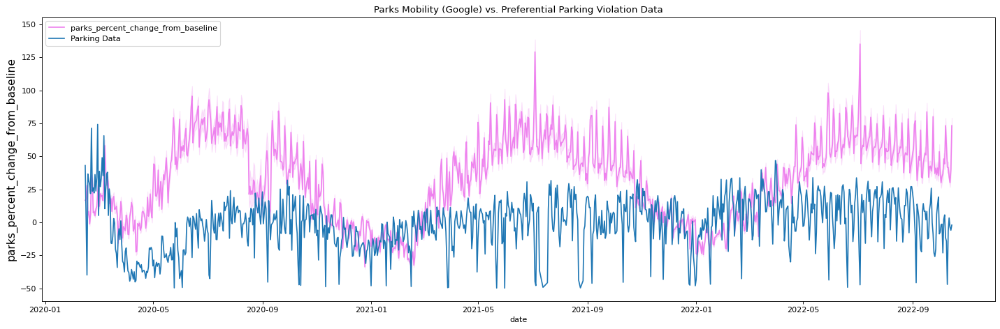

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(18,6), dpi=80, sharex=True)
sns.lineplot(data=df_google, x="date", y= "parks_percent_change_from_baseline", label="parks_percent_change_from_baseline", color='Violet', ax=axes)
sns.lineplot(x=grouped_g.index, y=grouped_g['pct_change_PP']/2, label='Parking Data', ax=axes)
axes.set_ylabel("parks_percent_change_from_baseline", fontsize = 14)
axes.set_title("Parks Mobility (Google) vs. Preferential Parking Violation Data")
axes.legend()
plt.tight_layout()
plt.show()


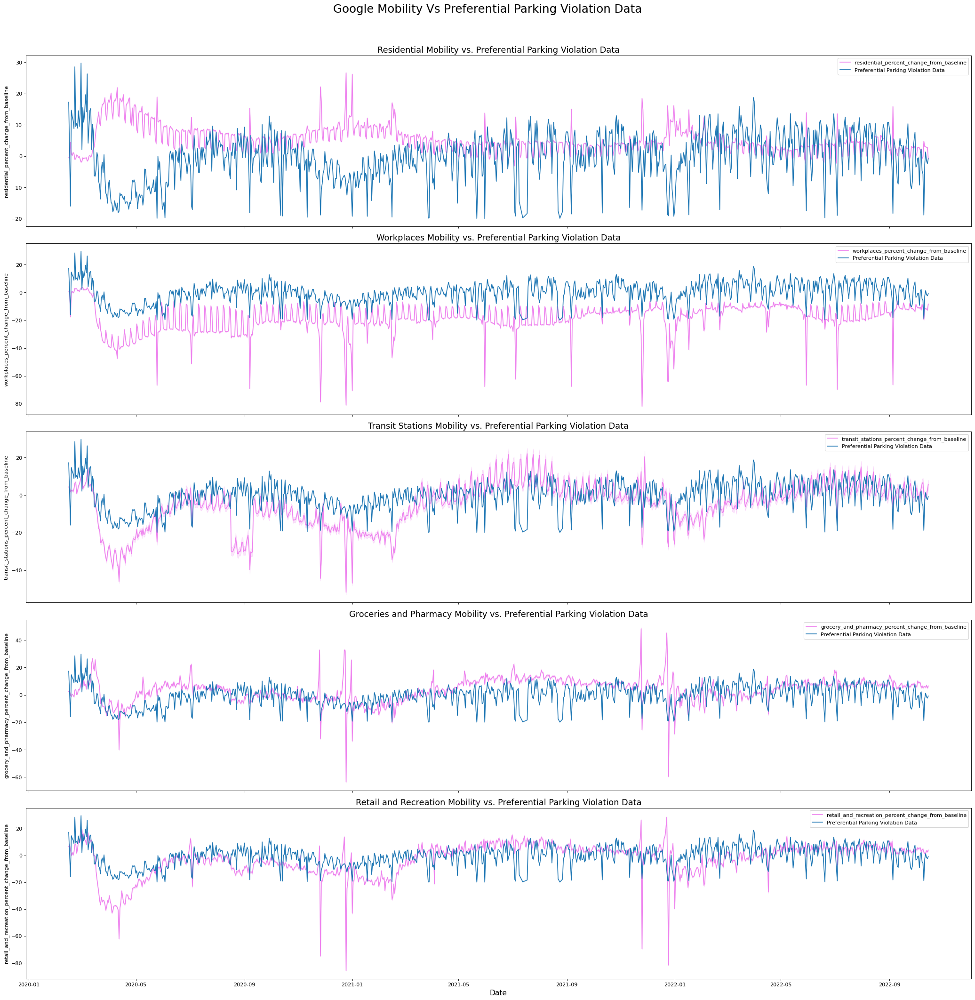

In [ ]:

fig, axes = plt.subplots(5, 1, figsize=(26, 26), dpi=80, sharex=True)
columns_to_compare = [
    "residential_percent_change_from_baseline",
    "workplaces_percent_change_from_baseline",
    "transit_stations_percent_change_from_baseline",
    "grocery_and_pharmacy_percent_change_from_baseline",
    "retail_and_recreation_percent_change_from_baseline"
]
subplot_titles = [
    "Residential Mobility vs. Preferential Parking Violation Data",
    "Workplaces Mobility vs. Preferential Parking Violation Data",
    "Transit Stations Mobility vs. Preferential Parking Violation Data",
    "Groceries and Pharmacy Mobility vs. Preferential Parking Violation Data",
    "Retail and Recreation Mobility vs. Preferential Parking Violation Data"
]
for i, (column, title) in enumerate(zip(columns_to_compare, subplot_titles)):
    sns.lineplot(data=df_google, x="date", y=df_google[column], label=column, color='Violet', ax=axes[i])
    sns.lineplot(x=grouped_g.index, y=grouped_g['pct_change_PP']/5, label='Preferential Parking Violation Data', ax=axes[i])
    axes[i].set_ylabel(column)
    axes[i].set_title(title, fontsize = 16)
    axes[i].legend()
axes[-1].set_xlabel('Date',fontsize = 14)
plt.suptitle("Google Mobility Vs Preferential Parking Violation Data", fontsize = 22, y = 1.02)
plt.tight_layout()
plt.show()


####v. Display of Tabs Violation Data Vs Google Mobility

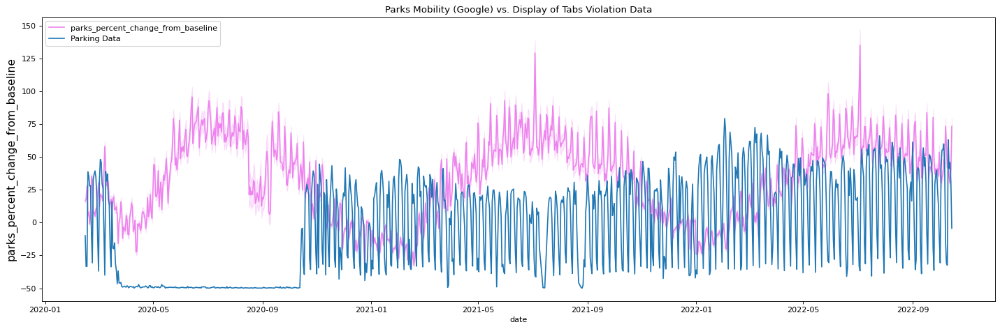

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(18,6), dpi=80, sharex=True)
sns.lineplot(data=df_google, x="date", y= "parks_percent_change_from_baseline", label="parks_percent_change_from_baseline", color='Violet', ax=axes)
sns.lineplot(x=grouped_g.index, y=grouped_g['pct_change_DOT']/2, label='Parking Data', ax=axes)
axes.set_ylabel("parks_percent_change_from_baseline", fontsize = 14)
axes.set_title("Parks Mobility (Google) vs. Display of Tabs Violation Data")
axes.legend()
plt.tight_layout()
plt.show()


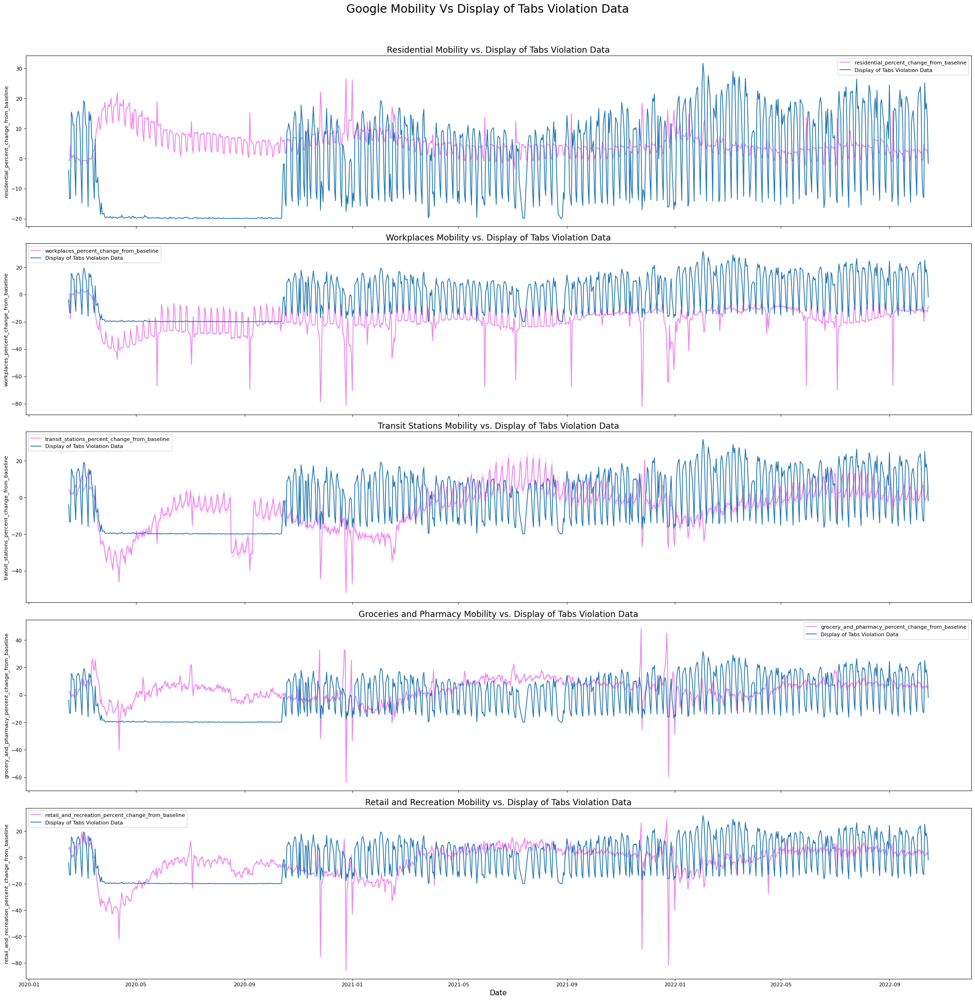

In [ ]:

fig, axes = plt.subplots(5, 1, figsize=(26, 26), dpi=80, sharex=True)
columns_to_compare = [
    "residential_percent_change_from_baseline",
    "workplaces_percent_change_from_baseline",
    "transit_stations_percent_change_from_baseline",
    "grocery_and_pharmacy_percent_change_from_baseline",
    "retail_and_recreation_percent_change_from_baseline"
]
subplot_titles = [
    "Residential Mobility vs. Display of Tabs Violation Data",
    "Workplaces Mobility vs. Display of Tabs Violation Data",
    "Transit Stations Mobility vs. Display of Tabs Violation Data",
    "Groceries and Pharmacy Mobility vs. Display of Tabs Violation Data",
    "Retail and Recreation Mobility vs. Display of Tabs Violation Data"
]
for i, (column, title) in enumerate(zip(columns_to_compare, subplot_titles)):
    sns.lineplot(data=df_google, x="date", y=df_google[column], label=column, color='Violet', ax=axes[i])
    sns.lineplot(x=grouped_g.index, y=grouped_g['pct_change_DOT']/5, label='Display of Tabs Violation Data', ax=axes[i])
    axes[i].set_ylabel(column)
    axes[i].set_title(title, fontsize = 16)
    axes[i].legend()
axes[-1].set_xlabel('Date',fontsize = 14)
plt.suptitle("Google Mobility Vs Display of Tabs Violation Data", fontsize = 22, y = 1.02)
plt.tight_layout()
plt.show()


##6. Apple Mobility Vs Top 5 Parking Violations

####Setting baseline as 13th January 2020 for parking data to calculate normalization

In [ ]:
top_5_data_apple = top_5_data[(top_5_data['Issue Date'] >= '01-13-2020') & (top_5_data['Issue Date'] <= '10-26-2021')]

In [ ]:
top_5_data_apple_nopark = top_5_data_apple[top_5_data_apple['Violation Description']=='NO PARK/STREET CLEAN']
top_5_data_apple_meterexp = top_5_data_apple[top_5_data_apple['Violation Description']=='METER EXP.']
top_5_data_apple_redzone = top_5_data_apple[top_5_data_apple['Violation Description']=='RED ZONE']
top_5_data_apple_prepark = top_5_data_apple[top_5_data_apple['Violation Description']=='PREFERENTIAL PARKING']
top_5_data_apple_dispoftabs = top_5_data_apple[top_5_data_apple['Violation Description']=='DISPLAY OF TABS']


In [ ]:

per_day_count_nopark = top_5_data_apple_nopark.groupby(top_5_data_apple_nopark['Issue Date']).size()
per_day_count_nopark = per_day_count_nopark.to_frame().reset_index()
per_day_count_nopark.columns = ['Issue Date', 'Counts']
per_day_count_nopark.sort_values(by="Issue Date")
df_Jan_13 = per_day_count_nopark.loc[per_day_count_nopark['Issue Date'] == '2020-01-13']
df_Jan_13 = df_Jan_13['Counts'].item()
per_day_count_nopark['pct_change'] = ((per_day_count_nopark['Counts'] - df_Jan_13)*100)/df_Jan_13


In [ ]:

per_day_count_meterexp = top_5_data_apple_meterexp.groupby(top_5_data_apple_meterexp['Issue Date']).size()
per_day_count_meterexp = per_day_count_meterexp.to_frame().reset_index()
per_day_count_meterexp.columns = ['Issue Date', 'Counts']
per_day_count_meterexp.sort_values(by="Issue Date")
df_Jan_13 = per_day_count_meterexp.loc[per_day_count_meterexp['Issue Date'] == '2020-01-13']
df_Jan_13 = df_Jan_13['Counts'].item()
per_day_count_meterexp['pct_change'] = ((per_day_count_meterexp['Counts'] - df_Jan_13)*100)/df_Jan_13


In [ ]:

per_day_count_redzone = top_5_data_apple_redzone.groupby(top_5_data_apple_redzone['Issue Date']).size()
per_day_count_redzone = per_day_count_redzone.to_frame().reset_index()
per_day_count_redzone.columns = ['Issue Date', 'Counts']
per_day_count_redzone.sort_values(by="Issue Date")
df_Jan_13 = per_day_count_redzone.loc[per_day_count_redzone['Issue Date'] == '2020-01-13']
df_Jan_13 = df_Jan_13['Counts'].item()
per_day_count_redzone['pct_change'] = ((per_day_count_redzone['Counts'] - df_Jan_13)*100)/df_Jan_13


In [ ]:

per_day_count_prepark = top_5_data_apple_prepark.groupby(top_5_data_apple_prepark['Issue Date']).size()
per_day_count_prepark = per_day_count_prepark.to_frame().reset_index()
per_day_count_prepark.columns = ['Issue Date', 'Counts']
per_day_count_prepark.sort_values(by="Issue Date")
df_Jan_13 = per_day_count_prepark.loc[per_day_count_prepark['Issue Date'] == '2020-01-13']
df_Jan_13 = df_Jan_13['Counts'].item()
per_day_count_prepark['pct_change'] = ((per_day_count_prepark['Counts'] - df_Jan_13)*100)/df_Jan_13


In [ ]:

per_day_count_dispoftabs = top_5_data_apple_dispoftabs.groupby(top_5_data_apple_dispoftabs['Issue Date']).size()
per_day_count_dispoftabs = per_day_count_dispoftabs.to_frame().reset_index()
per_day_count_dispoftabs.columns = ['Issue Date', 'Counts']
per_day_count_dispoftabs.sort_values(by="Issue Date")
df_Jan_13 = per_day_count_dispoftabs.loc[per_day_count_dispoftabs['Issue Date'] == '2020-01-13']
df_Jan_13 = df_Jan_13['Counts'].item()
per_day_count_dispoftabs['pct_change'] = ((per_day_count_dispoftabs['Counts'] - df_Jan_13)*100)/df_Jan_13


####Plots showing Apple Mobility Vs Top 5 parking violations (Ascending order)

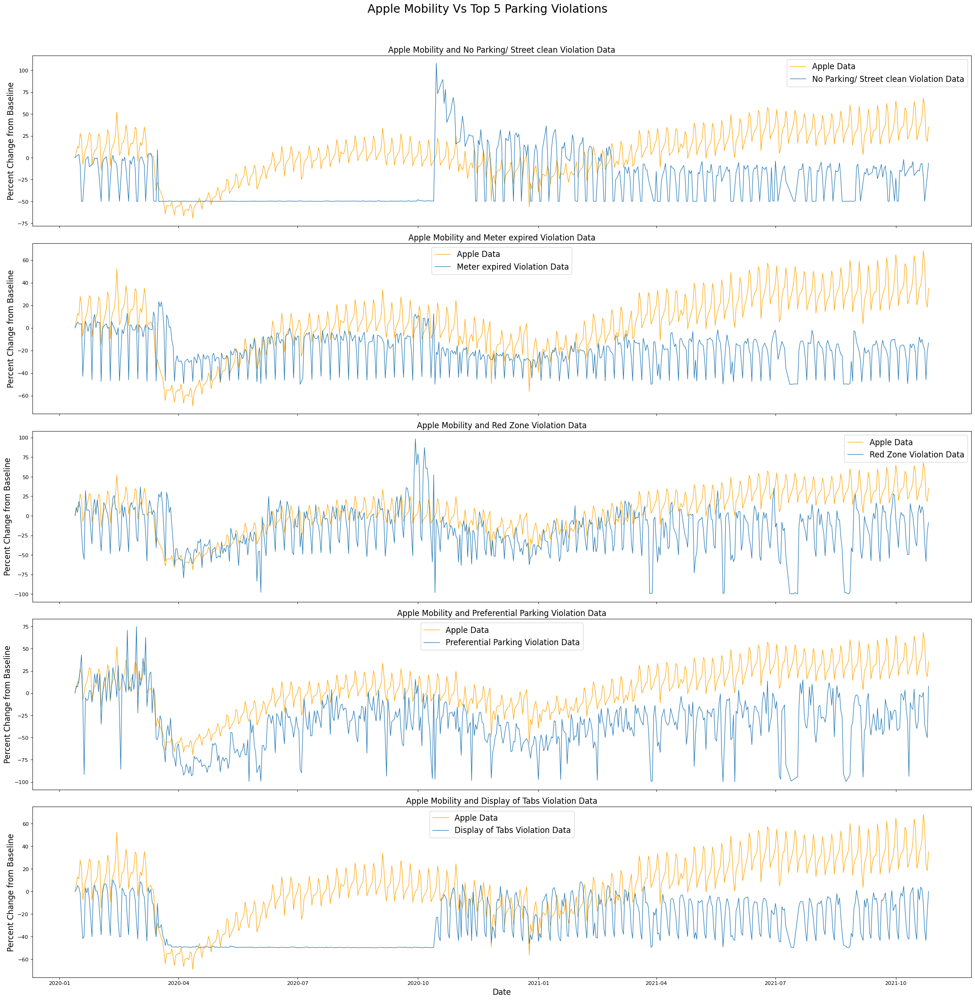

In [ ]:
fig, axes = plt.subplots(5, 1, figsize=(26, 26), dpi=80, sharex=True)

sns.lineplot(data=df_apple, x="Date", y=df_apple['Driving']-100, label='Apple Data', color = 'Orange', ax = axes[0], linewidth = 1)
sns.lineplot(data=per_day_count_nopark, x="Issue Date", y=per_day_count_nopark['pct_change']/2, label='No Parking/ Street clean Violation Data', ax = axes[0],linewidth = 1)
axes[0].set_xlabel('Date', fontsize = 15)
axes[0].set_ylabel('Percent Change from Baseline', fontsize = 15)
axes[0].set_title('Apple Mobility and No Parking/ Street clean Violation Data', fontsize = 15)
axes[0].legend(fontsize = 15)

sns.lineplot(data=df_apple, x="Date", y=df_apple['Driving']-100, label='Apple Data', color = 'Orange',linewidth = 1, ax = axes[1])
sns.lineplot(data=per_day_count_meterexp, x="Issue Date", y=per_day_count_meterexp['pct_change']/2, linewidth = 1, label='Meter expired Violation Data', ax = axes[1])
axes[1].set_xlabel('Date', fontsize = 15)
axes[1].set_ylabel('Percent Change from Baseline', fontsize = 15)
axes[1].set_title('Apple Mobility and Meter expired Violation Data', fontsize = 15)
axes[1].legend(fontsize = 15)

sns.lineplot(data=df_apple, x="Date", y=df_apple['Driving']-100, label='Apple Data', color = 'Orange',linewidth = 1, ax = axes[2])
sns.lineplot(data=per_day_count_redzone, x="Issue Date", y=per_day_count_redzone['pct_change'], linewidth = 1, label='Red Zone Violation Data', ax = axes[2])
axes[2].set_xlabel('Date', fontsize = 15)
axes[2].set_ylabel('Percent Change from Baseline', fontsize = 15)
axes[2].set_title('Apple Mobility and Red Zone Violation Data', fontsize = 15)
axes[2].legend(fontsize = 15)

sns.lineplot(data=df_apple, x="Date", y=df_apple['Driving']-100, label='Apple Data', color = 'Orange',linewidth = 1, ax = axes[3])
sns.lineplot(data=per_day_count_prepark, x="Issue Date", y=per_day_count_prepark['pct_change'], linewidth = 1, label='Preferential Parking Violation Data', ax = axes[3])
axes[3].set_xlabel('Date', fontsize = 15)
axes[3].set_ylabel('Percent Change from Baseline', fontsize = 15)
axes[3].set_title('Apple Mobility and Preferential Parking Violation Data', fontsize = 15)
axes[3].legend(fontsize = 15)

sns.lineplot(data=df_apple, x="Date", y=df_apple['Driving']-100, label='Apple Data', color = 'Orange',linewidth = 1, ax = axes[4])
sns.lineplot(data=per_day_count_dispoftabs, x="Issue Date", y=per_day_count_dispoftabs['pct_change']/2, linewidth = 1, label='Display of Tabs Violation Data', ax = axes[4])
axes[4].set_xlabel('Date', fontsize = 15)
axes[4].set_ylabel('Percent Change from Baseline', fontsize = 15)
axes[4].set_title('Apple Mobility and Display of Tabs Violation Data', fontsize = 15)
axes[4].legend(fontsize = 15)

plt.suptitle('Apple Mobility Vs Top 5 Parking Violations', fontsize=22, y=1.02)
plt.tight_layout()
plt.show()


##7. Meta Mobility Vs Top 5 Parking Violations

####Calculating Mean Normalisation for Parking data

Filtering parking data in meta data time range

In [ ]:
filtered_df_meta = top_5_data[(top_5_data['Issue Date'] >= '03-01-2020') & (top_5_data['Issue Date'] <= '5-22-2022')]
filtered_df_meta['Dayofweek'] = filtered_df_meta['Issue Date'].dt.day_name()

<ipython-input-15-0b638dc44941>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df_meta['Dayofweek'] = filtered_df_meta['Issue Date'].dt.day_name()


In [ ]:
baseline_d = top_5_data[top_5_data['Issue Date'].dt.year == 2020][top_5_data['Issue Date'].dt.month == 2]

<ipython-input-16-59f24e79e258>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseline_d = top_5_data[top_5_data['Issue Date'].dt.year == 2020][top_5_data['Issue Date'].dt.month == 2]


In [ ]:
baseline_d['Dayofweek'] = baseline_d['Issue Date'].dt.day_name()

Computing average ticket counts for each weekday

In [ ]:
avg_list = []
weekdays = ['Monday','Tuesday','Wednesday', 'Thursday','Friday','Saturday', 'Sunday']
for i in range(len(weekdays)):
    d = baseline_d[baseline_d['Dayofweek'] == weekdays[i]]
    c = d.groupby('Issue Date')['Ticket number'].count()
    a = c.mean()
    avg_list.append(a)

In [ ]:
filtered_df_meta_nopark = filtered_df_meta[filtered_df_meta['Violation Description']=='NO PARK/STREET CLEAN']
filtered_df_meta_meterexp = filtered_df_meta[filtered_df_meta['Violation Description']=='METER EXP.']
filtered_df_meta_redzone = filtered_df_meta[filtered_df_meta['Violation Description']=='RED ZONE']
filtered_df_meta_prepark = filtered_df_meta[filtered_df_meta['Violation Description']=='PREFERENTIAL PARKING']
filtered_df_meta_dispoftabs = filtered_df_meta[filtered_df_meta['Violation Description']=='DISPLAY OF TABS']

In [ ]:
avg_baseline_df = pd.DataFrame({'Weekday' : weekdays, 'Avg_baseline_count' : avg_list})

In [ ]:
#  = pd.merge(filtered_df_meta_cv, avg_baseline_df, left_on = 'Dayofweek',right_on = 'Weekday', how = 'inner')
# ncv = pd.merge(filtered_df_meta_ncv, avg_baseline_df, left_on = 'Dayofweek',right_on = 'Weekday', how = 'inner')

In [ ]:
per_day_count_m_nopark = filtered_df_meta_nopark.groupby(filtered_df_meta_nopark['Issue Date']).size()
per_day_count_m_nopark = per_day_count_m_nopark.to_frame().reset_index()
per_day_count_m_nopark.columns = ['Issue Date', 'Counts']

In [ ]:
per_day_count_m_meterexp = filtered_df_meta_meterexp.groupby(filtered_df_meta_meterexp['Issue Date']).size()
per_day_count_m_meterexp = per_day_count_m_meterexp.to_frame().reset_index()
per_day_count_m_meterexp.columns = ['Issue Date', 'Counts']

In [ ]:
per_day_count_m_redzone = filtered_df_meta_redzone.groupby(filtered_df_meta_redzone['Issue Date']).size()
per_day_count_m_redzone = per_day_count_m_redzone.to_frame().reset_index()
per_day_count_m_redzone.columns = ['Issue Date', 'Counts']

In [ ]:
per_day_count_m_prepark = filtered_df_meta_prepark.groupby(filtered_df_meta_prepark['Issue Date']).size()
per_day_count_m_prepark = per_day_count_m_prepark.to_frame().reset_index()
per_day_count_m_prepark.columns = ['Issue Date', 'Counts']

In [ ]:
per_day_count_m_dispoftabs = filtered_df_meta_dispoftabs.groupby(filtered_df_meta_dispoftabs['Issue Date']).size()
per_day_count_m_dispoftabs = per_day_count_m_dispoftabs.to_frame().reset_index()
per_day_count_m_dispoftabs.columns = ['Issue Date', 'Counts']

In [ ]:
per_day_count_m_nopark['Dayofweek'] = per_day_count_m_nopark['Issue Date'].dt.day_name()
per_day_count_m_meterexp['Dayofweek'] = per_day_count_m_meterexp['Issue Date'].dt.day_name()
per_day_count_m_redzone['Dayofweek'] = per_day_count_m_redzone['Issue Date'].dt.day_name()
per_day_count_m_prepark['Dayofweek'] = per_day_count_m_prepark['Issue Date'].dt.day_name()
per_day_count_m_dispoftabs['Dayofweek'] = per_day_count_m_dispoftabs['Issue Date'].dt.day_name()

In [ ]:
req_df_m_nopark = pd.merge(per_day_count_m_nopark, avg_baseline_df, left_on = 'Dayofweek', right_on = 'Weekday')
req_df_m_meterexp = pd.merge(per_day_count_m_meterexp, avg_baseline_df, left_on = 'Dayofweek', right_on = 'Weekday')
req_df_m_redzone = pd.merge(per_day_count_m_redzone, avg_baseline_df, left_on = 'Dayofweek', right_on = 'Weekday')
req_df_m_prepark = pd.merge(per_day_count_m_prepark, avg_baseline_df, left_on = 'Dayofweek', right_on = 'Weekday')
req_df_m_dispoftabs = pd.merge(per_day_count_m_dispoftabs, avg_baseline_df, left_on = 'Dayofweek', right_on = 'Weekday')

Computing the relative change of number of parking ticket counts from the average baseline on daily basis

In [ ]:
req_df_m_nopark['relative_change'] = (req_df_m_nopark['Counts'] - req_df_m_nopark['Avg_baseline_count'])/req_df_m_nopark['Avg_baseline_count']
req_df_m_meterexp['relative_change'] = (req_df_m_meterexp['Counts'] - req_df_m_meterexp['Avg_baseline_count'])/req_df_m_meterexp['Avg_baseline_count']
req_df_m_redzone['relative_change'] = (req_df_m_redzone['Counts'] - req_df_m_redzone['Avg_baseline_count'])/req_df_m_redzone['Avg_baseline_count']
req_df_m_prepark['relative_change'] = (req_df_m_prepark['Counts'] - req_df_m_prepark['Avg_baseline_count'])/req_df_m_prepark['Avg_baseline_count']
req_df_m_dispoftabs['relative_change'] = (req_df_m_dispoftabs['Counts'] - req_df_m_dispoftabs['Avg_baseline_count'])/req_df_m_dispoftabs['Avg_baseline_count']

In [ ]:
grouped_m = grouped[(grouped.index >= df_meta['ds'].min())&(grouped.index <= df_meta['ds'].max())]

####i. Plots showing Meta Mobility Vs No Parking/ Street Clean Violation data

* Change in movement is obtained by counting the number of Bing Tiles
* Stay put is recorded when there is no movement is observed between two bing tiles for 24 hours.

In [ ]:
grouped_m['pct_change_NP'].dtype

dtype('float64')

Scaling Parking data for Meta has been a little tricky for me. I will be relooking into this.

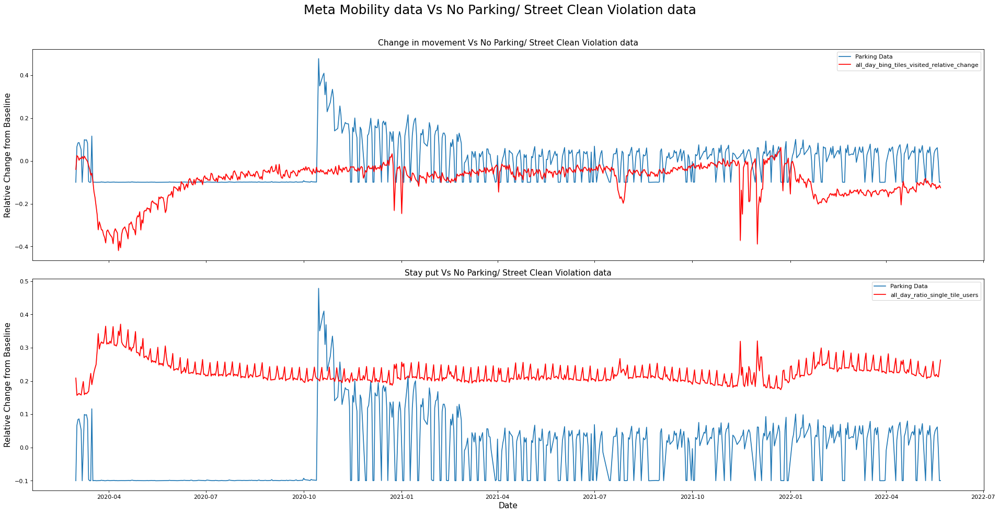

In [ ]:

fig, axes = plt.subplots(2, 1, figsize=(24, 12), dpi=80, sharex=True)
x_parking_cv = grouped_m.index
y_parking_cv = grouped_m['pct_change_NP']/1000
columns_to_compare = [ 'all_day_bing_tiles_visited_relative_change', 'all_day_ratio_single_tile_users'

]
subplot_titles = [
    'Change in movement Vs No Parking/ Street Clean Violation data', 'Stay put Vs No Parking/ Street Clean Violation data'
]
for i, (column, title) in enumerate(zip(columns_to_compare, subplot_titles)):
    sns.lineplot(x=x_parking_cv, y = y_parking_cv, label='Parking Data', ax=axes[i])
    sns.lineplot(data=df_meta, x="ds", y = column, label=column, color='Red', ax=axes[i])
    axes[i].set_ylabel('Relative Change from Baseline', fontsize = 14)
    axes[i].set_title(title, fontsize = 14)
    axes[i].legend(loc = "upper right",fontsize = 10)
    axes[i].set_xlabel('Date', fontsize = 14)
plt.suptitle('Meta Mobility data Vs No Parking/ Street Clean Violation data',fontsize = 22, y=1.02)
plt.tight_layout()
plt.show()

####ii. Plots showing Meta Mobility Vs Meter expired Violation data

* Change in movement is obtained by counting the number of Bing Tiles
* Stay put is recorded when there is no movement is observed between two bing tiles for 24 hours.

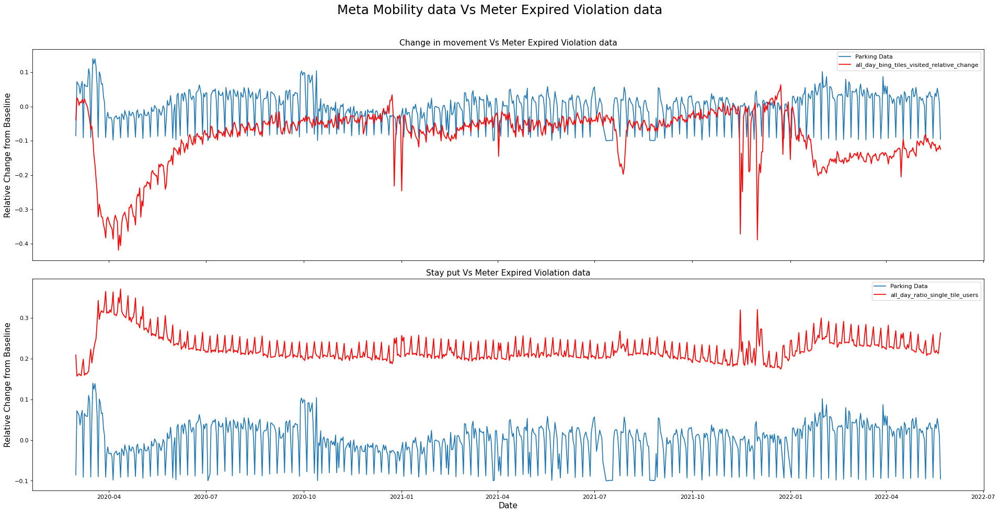

In [ ]:

fig, axes = plt.subplots(2, 1, figsize=(24, 12), dpi=80, sharex=True)
x_parking_cv = grouped_m.index
y_parking_cv = grouped_m['pct_change_ME']/1000
columns_to_compare = [ 'all_day_bing_tiles_visited_relative_change', 'all_day_ratio_single_tile_users'

]
subplot_titles = [
    'Change in movement Vs Meter Expired Violation data', 'Stay put Vs Meter Expired Violation data'
]
for i, (column, title) in enumerate(zip(columns_to_compare, subplot_titles)):
    sns.lineplot(x=x_parking_cv, y = y_parking_cv, label='Parking Data',ax=axes[i])
    sns.lineplot(data=df_meta, x="ds", y = column, label=column, color='Red', ax=axes[i])
    axes[i].set_ylabel('Relative Change from Baseline', fontsize = 14)
    axes[i].set_title(title, fontsize = 14)
    axes[i].legend(loc = "upper right",fontsize = 10)
    axes[i].set_xlabel('Date', fontsize = 14)
plt.suptitle('Meta Mobility data Vs Meter Expired Violation data',fontsize = 22, y=1.02)
plt.tight_layout()
plt.show()

####iii. Plots showing Meta Mobility Vs Red Zone Violation data

* Change in movement is obtained by counting the number of Bing Tiles
* Stay put is recorded when there is no movement is observed between two bing tiles for 24 hours.

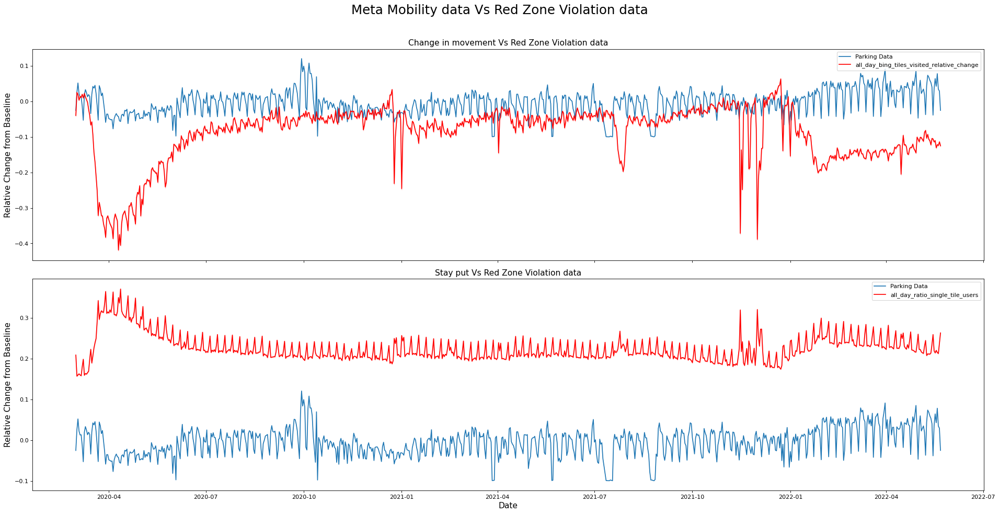

In [ ]:

fig, axes = plt.subplots(2, 1, figsize=(24, 12), dpi=80, sharex=True)
x_parking_cv = grouped_m.index
y_parking_cv = grouped_m['pct_change_RZ']/1000
columns_to_compare = [ 'all_day_bing_tiles_visited_relative_change', 'all_day_ratio_single_tile_users'

]
subplot_titles = [
    'Change in movement Vs Red Zone Violation data', 'Stay put Vs Red Zone Violation data'
]
for i, (column, title) in enumerate(zip(columns_to_compare, subplot_titles)):
    sns.lineplot(x=x_parking_cv, y = y_parking_cv , label='Parking Data', ax=axes[i])
    sns.lineplot(data=df_meta, x="ds", y = column, label=column,color='Red',  ax=axes[i])
    axes[i].set_ylabel('Relative Change from Baseline', fontsize = 14)
    axes[i].set_title(title, fontsize = 14)
    axes[i].legend(loc = "upper right",fontsize = 10)
    axes[i].set_xlabel('Date', fontsize = 14)
plt.suptitle('Meta Mobility data Vs Red Zone Violation data',fontsize = 22, y=1.02)
plt.tight_layout()
plt.show()

####iv. Plots showing Meta Mobility Vs Preferential Parking Violation data

* Change in movement is obtained by counting the number of Bing Tiles
* Stay put is recorded when there is no movement is observed between two bing tiles for 24 hours.

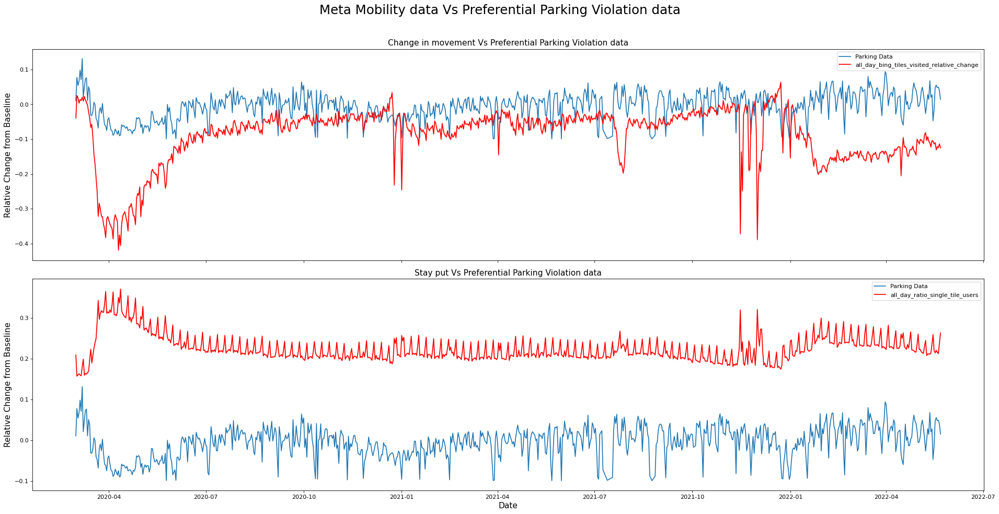

In [ ]:

fig, axes = plt.subplots(2, 1, figsize=(24, 12), dpi=80, sharex=True)
x_parking_cv = grouped_m.index
y_parking_cv = grouped_m['pct_change_PP']/1000
columns_to_compare = [ 'all_day_bing_tiles_visited_relative_change', 'all_day_ratio_single_tile_users'

]
subplot_titles = [
    'Change in movement Vs Preferential Parking Violation data', 'Stay put Vs Preferential Parking Violation data'
]
for i, (column, title) in enumerate(zip(columns_to_compare, subplot_titles)):
    sns.lineplot(x=x_parking_cv, y = y_parking_cv, label='Parking Data', ax=axes[i])
    sns.lineplot(data=df_meta, x="ds", y = column, label=column, color='Red', ax=axes[i])
    axes[i].set_ylabel('Relative Change from Baseline', fontsize = 14)
    axes[i].set_title(title, fontsize = 14)
    axes[i].legend(loc = "upper right",fontsize = 10)
    axes[i].set_xlabel('Date', fontsize = 14)
plt.suptitle('Meta Mobility data Vs Preferential Parking Violation data',fontsize = 22, y=1.02)
plt.tight_layout()
plt.show()

####v. Plots showing Meta Mobility Vs Display of Tabs Violation data

* Change in movement is obtained by counting the number of Bing Tiles
* Stay put is recorded when there is no movement is observed between two bing tiles for 24 hours.

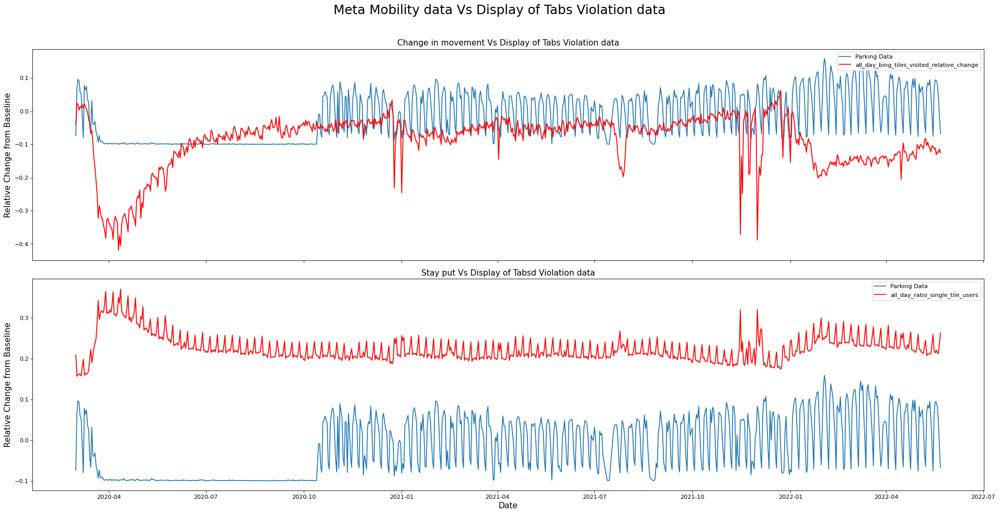

In [ ]:

fig, axes = plt.subplots(2, 1, figsize=(24, 12), dpi=80, sharex=True)
x_parking_cv = grouped_m.index
y_parking_cv = grouped_m['pct_change_DOT']/1000
columns_to_compare = [ 'all_day_bing_tiles_visited_relative_change', 'all_day_ratio_single_tile_users'

]
subplot_titles = [
    'Change in movement Vs Display of Tabs Violation data', 'Stay put Vs Display of Tabsd Violation data'
]
for i, (column, title) in enumerate(zip(columns_to_compare, subplot_titles)):
    sns.lineplot(x=x_parking_cv, y = y_parking_cv, label='Parking Data', ax=axes[i])
    sns.lineplot(data=df_meta, x="ds", y = column, label=column, color='Red', ax=axes[i])
    axes[i].set_ylabel('Relative Change from Baseline', fontsize = 14)
    axes[i].set_title(title, fontsize = 14)
    axes[i].legend(loc = "upper right",fontsize = 10)
    axes[i].set_xlabel('Date', fontsize = 14)
plt.suptitle('Meta Mobility data Vs Display of Tabs Violation data',fontsize = 22, y=1.02)
plt.tight_layout()
plt.show()